# Data Storytelling

In order to gain a better intuition regarding what features are most indicative of wins, graphical and tabular analysis is performed. In particular, analysis will be performed on:
 - dragons retrieved within the game
 - length of game 
 - gold difference over course of the game
 - most frequent kill locations
 - champion pick rate
 - ban rate 
 - frequent champion matchups via correlation matrices 

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('whitegrid')

In [2]:
league = pd.read_csv("../Dataset/LeagueofLegends.csv")

nans = lambda df: df[df.isnull().any(axis=1)]
nans(league) # Can't handle these kinds of NaN values, will instead drop 
league.dropna(inplace=True)

In [3]:
league_wrangled = pd.read_csv("../Dataset/Wrangled_LeagueofLegends.csv")

## Type of Drags Taken by Winning Teams by Year

Dragons within League are highly contested objectives due to the massive team-wide buffs they grant to the team that captures them. Prior to 2016, there was only one type of dragon which granted gold to the team. After 2016, five new types of dragons were introduced. These are: 

- Fire, which grants increased damage 
- Ocean, which grants increased resource regeneration
- Earth, which increases damage to structures and objectives 
- Air, which increases mobility
- Elder, doubles previous buffs granted from dragons along with damage that ignores defenses 

By visualizing which dragons were taken by the winning teams it may be possible to determine which dragons were most responsbile for wins. For example, if the graph displays a larger number of earth dragons taken by winning teams, then it can be said that if a team takes an earth dragon, they may be more likely to win. 

In [4]:
# Retrieve all columns relevant to plot
blue_drags = ['bNone', 'bEarth_drag', 'bWater_drag', 'bAir_drag', 'bFire_drag', 'bElder_drag']
red_drags = ['rNone', 'rEarth_drag', 'rWater_drag', 'rAir_drag', 'rFire_drag', 'rElder_drag']
renamed_cols = ['Year', 'None', 'Earth', 'Ocean', 'Air', 'Fire',  'Elder', 'None', 'Earth', 'Ocean', 'Air', 'Fire',  'Elder']
drags_df = league_wrangled[blue_drags + red_drags]
drags_df = pd.concat([league[['Year', 'bResult']].reset_index(drop=True), drags_df], axis=1)
drags_df.rename(columns={'bResult':'Result'}, inplace=True)
 
# Extract only drags taken by winning teams
winning_blue = drags_df[blue_drags].where(drags_df['Result'] == 1, 0)
winning_red = drags_df[red_drags].where(drags_df['Result'] == 0, 0)
drags_df = pd.concat([drags_df['Year'], winning_blue, winning_red], axis=1)
drags_df.columns = renamed_cols
winning_drags = drags_df.groupby(lambda x:x, axis=1).sum()
winning_drags.drop('None', axis=1, inplace=True)
winning_drags = winning_drags[(winning_drags['Year'] != 2014) & (winning_drags['Year'] != 2015)]

# Group results by year 
winning_drags_by_year = winning_drags.groupby('Year').sum()
winning_drags_by_year.head()

# Convert to percentages
winning_drags_by_year_percent = winning_drags_by_year.apply(lambda x: 100 * x / float(x.sum()), axis=1)

print(winning_drags_by_year)
print()
print(winning_drags_by_year_percent)

           Air   Earth   Elder    Fire   Ocean
Year                                          
2016.0   831.0   867.0   564.0   574.0   833.0
2017.0  1787.0  1850.0  1230.0  1421.0  1898.0
2018.0   143.0   110.0    94.0    91.0   119.0

              Air      Earth      Elder       Fire      Ocean
Year                                                         
2016.0  22.649223  23.630417  15.372036  15.644590  22.703734
2017.0  21.829954  22.599560  15.025654  17.358905  23.185927
2018.0  25.673250  19.748654  16.876122  16.337522  21.364452


In [5]:
# reset index to allow proper melting
winning_drags_by_year.reset_index(inplace=True)
winning_drags_by_year_percent.reset_index(inplace=True)

# convert dataframe type to long to allow for easier plotting
winning_drags_by_year_long = winning_drags_by_year.melt(id_vars=['Year'], value_vars=['Air','Earth','Elder','Fire','Ocean'], 
                           var_name='drag type', value_name='num_of_drags')

winning_drags_by_year_percent_long = winning_drags_by_year_percent.melt(id_vars=['Year'], value_vars=['Air','Earth','Elder','Fire','Ocean'], 
                                   var_name='drag type', value_name='num_of_drags')

# convert 'Year' column to string in order to use as groupby column
winning_drags_by_year_long['Year'] = winning_drags_by_year_long.Year.astype(int).astype(str)
winning_drags_by_year_percent_long['Year'] = winning_drags_by_year_percent_long.Year.astype(int).astype(str)

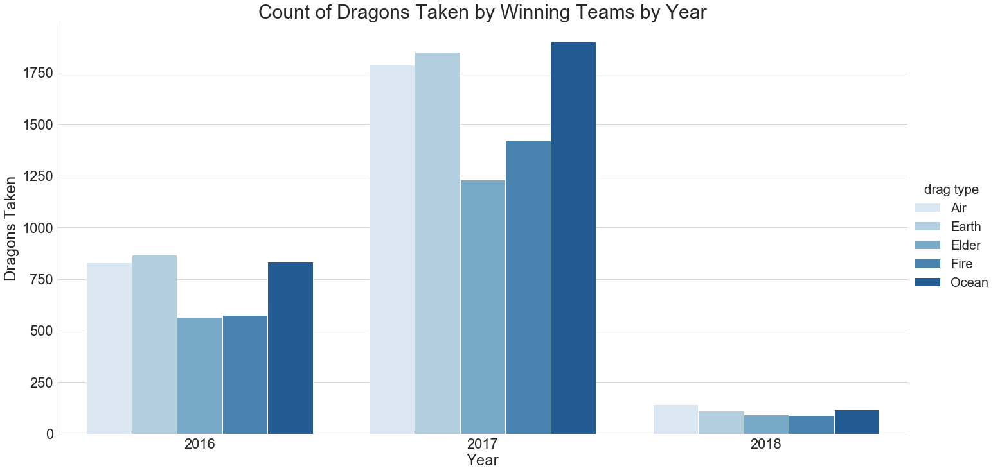

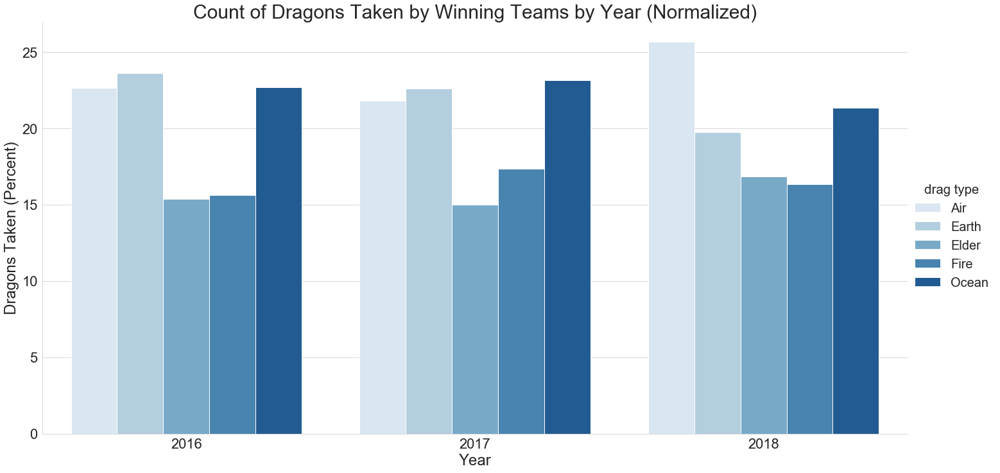

In [6]:
# set plot parameters
plt.rc('legend', fontsize=20)
plt.rc('xtick', labelsize=22)
plt.rc('ytick', labelsize=22)
plt.rc('axes', labelsize=24)

# plot dragons retrieved by count for 2016/2017/2018
drag_count = sns.catplot(x='Year', y='num_of_drags', hue='drag type', data=winning_drags_by_year_long, kind='bar', 
                         height=10, aspect=2, palette='Blues')
count_axes = drag_count.axes.flatten()[0]
count_axes.set_ylabel("Dragons Taken")
count_axes.set_title("Count of Dragons Taken by Winning Teams by Year", size=30)

# plot dragons retrieved by percent for 2016/2017/2018
drag_percent = sns.catplot(x='Year', y='num_of_drags', hue='drag type', data=winning_drags_by_year_percent_long, kind='bar', 
                           height=10, aspect=2, palette='Blues')
percent_axes = drag_percent.axes.flatten()[0]
percent_axes.set_ylabel("Dragons Taken (Percent)")
percent_axes.set_title("Count of Dragons Taken by Winning Teams by Year (Normalized)", size=30);


Because there was only one type of dragon in 2014 and 2015, this data has been ignored as there are no conclusions to be made from it. First, the number of dragons was grouped by year and then plotted. In the bar plot, the numbers were normalized in order to account for the number of league games played in each year, as there might not have been an equal number of games played each year. For 2016 and 2017, it is clear that the number of air, earth, and ocean dragons retrieved by the winning teams are equal at about 22 percent of the total dragons. The remaining 30 percent of the dragons are split amongst the fire and elder category. For the elder category, this is expected, as elder only became available after the game had reached 35 minutes. The fire category being less than the others can either be explained by in game frequnecy/randomness or by actual game impact. It seems that an increase in damage(fire) is less correlated with a win than an increase in regeneration(ocean), mobility(air), or damage to structures(earth). For 2018, air dragons are clearly more frequent, which is likely because the increased mobility allows for better objective control and teamfighting. 

## Length of Games Per Season By Year

The purpose of these plots is to get a better idea of how the game evolved as time passed. A possible hypothesis is that, as the game length increases, one team may be more likely to win, either due to access to key objectives or because champs that become more powerful as the game goes on may be more likely to be picked by a certain side.  

In [7]:
sns.set(style="ticks")

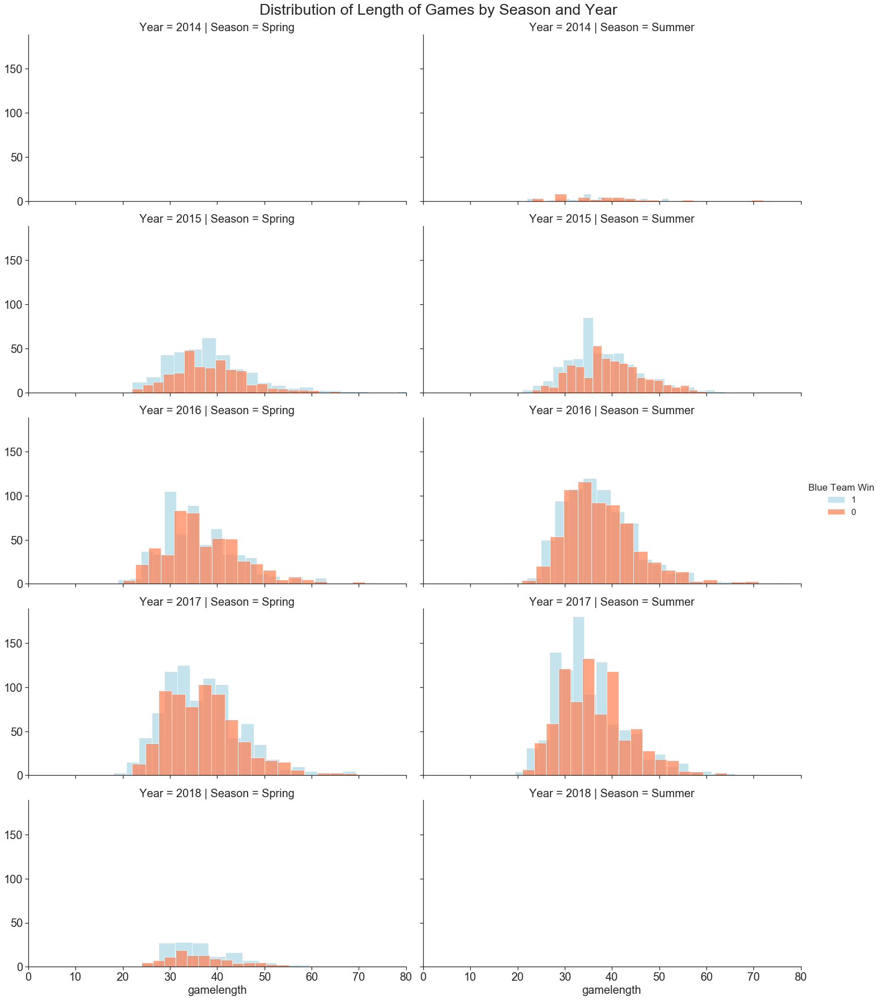

In [8]:
# Set plot parameters
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('axes',  labelsize=20)

# Colors to be used for histograms
hues = {'color': ['lightblue', 'coral']}

# Convert bResult to categorical to choose hist order (for easier viewing)
# league['bResult'] = league['bResult'].astype('category')

# Create facetgrid faceted by Year, Season, and Game Result and plot histograms
g = sns.FacetGrid(league, 
                  hue="bResult", row='Year', col='Season',
                  height=5, aspect=2, hue_kws=hues, hue_order=[1, 0], xlim=(0,80))
g = g.map(plt.hist, "gamelength", alpha=0.7, bins=20)

# Control figure aesthetics 
g.fig.suptitle("Distribution of Length of Games by Season and Year", size=27);
g.add_legend(title="Blue Team Win", fontsize=15, title_fontsize='90')
plt.subplots_adjust(top=0.95)

In [9]:
# Display mean of groups
print('\033[1m' + "Mean Length of Won Game by Year, Season, and Side" + '\033[0m')
print(league.groupby(['Year', 'Season', 'bResult']).mean())
print("\n")

# Display standard deviation of groups
print('\033[1m' + "Standard Deviation of Length of Won Game by Year, Season, and Side" + '\033[0m')
print(league.groupby(['Year', 'Season', 'bResult']).std())

Mean Length of Won Game by Year, Season, and Side
                     rResult  gamelength
Year Season bResult                     
2014 Summer 0            1.0   37.125000
            1            0.0   36.326087
2015 Spring 0            1.0   38.211409
            1            0.0   37.913889
     Summer 0            1.0   39.239474
            1            0.0   37.997812
2016 Spring 0            1.0   37.244489
            1            0.0   36.081882
     Summer 0            1.0   37.616085
            1            0.0   37.092414
2017 Spring 0            1.0   37.242647
            1            0.0   36.786962
     Summer 0            1.0   36.431790
            1            0.0   35.302158
2018 Spring 0            1.0   37.583333
            1            0.0   37.691729


Standard Deviation of Length of Won Game by Year, Season, and Side
                     rResult  gamelength
Year Season bResult                     
2014 Summer 0            0.0   10.117854
            1       

From the plots, the length of the games are all normally distributed. Additionally, the only notable difference between game lengths of the winning teams occurs during the summer season of 2015 and the spring season of 2016. Despite this, there is a clear trend. In all the groups except for the spring season of 2018, the red side teams had a higher average game length than the blue side team. In terms of standard deviation, the red team side consistently had a smaller standard deviation than the blue team side, except for the spring season of 2016 and the summer season of 2014. This trend supports the idea that the longer the game goes on, the more likely it is for the red team to win.

## Gold Difference by Length of Time (Blue Team Gold - Red Team Gold)

The purpose of this anlysis is to determine if there is a trend in how the gold difference between teams changes based on what side of the map they are on. This will provide further evidence in determining whether which side the team starts on is a determining factor in who will win the game. 

In [10]:
import ast 

# convert column data type from string to list
gold_diff = league['golddiff'].apply(ast.literal_eval)

# create dataframe groups
blue_2014 = gold_diff[(league['Year'] == 2014) & (league['bResult'] == 1)]
blue_2015 = gold_diff[(league['Year'] == 2015) & (league['bResult'] == 1)]
blue_2016 = gold_diff[(league['Year'] == 2016) & (league['bResult'] == 1)]
blue_2017 = gold_diff[(league['Year'] == 2017) & (league['bResult'] == 1)]
blue_2018 = gold_diff[(league['Year'] == 2018) & (league['bResult'] == 1)]

red_2014 = gold_diff[(league['Year'] == 2014) & (league['bResult'] == 0)]
red_2015 = gold_diff[(league['Year'] == 2015) & (league['bResult'] == 0)]
red_2016 = gold_diff[(league['Year'] == 2016) & (league['bResult'] == 0)]
red_2017 = gold_diff[(league['Year'] == 2017) & (league['bResult'] == 0)]
red_2018 = gold_diff[(league['Year'] == 2018) & (league['bResult'] == 0)]

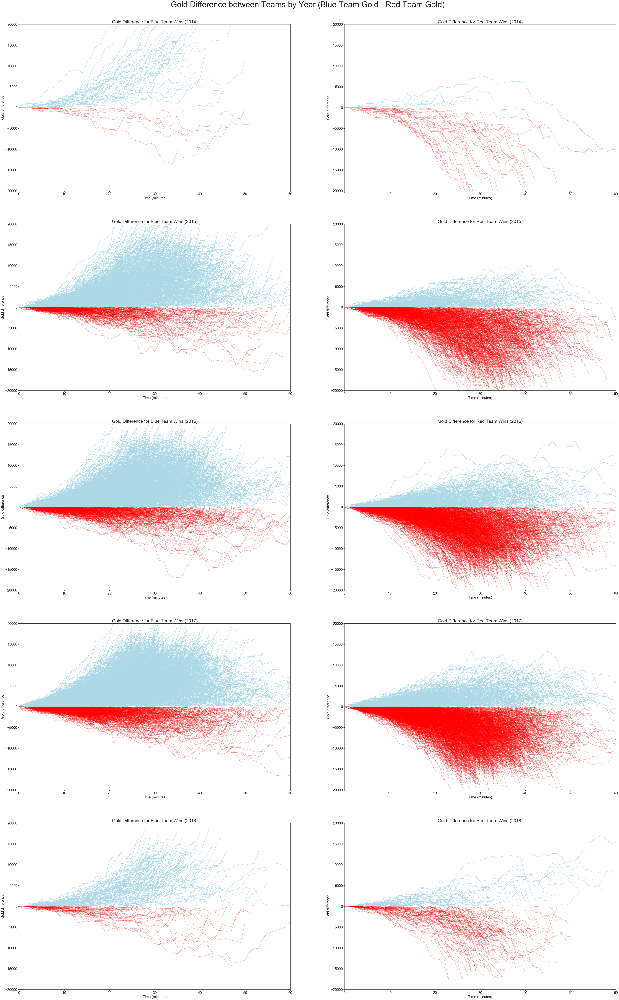

In [11]:
# Set plot parameters
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('axes',  labelsize=20)

gold_groups = [blue_2014, red_2014, blue_2015, red_2015, blue_2016, red_2016, blue_2017, red_2017, blue_2018, red_2018]

plot_titles = ['Gold Difference for Blue Team Wins (2014)', 
               'Gold Difference for Red Team Wins (2014)',
               'Gold Difference for Blue Team Wins (2015)',
               'Gold Difference for Red Team Wins (2015)',
               'Gold Difference for Blue Team Wins (2016)', 
               'Gold Difference for Red Team Wins (2016)',
               'Gold Difference for Blue Team Wins (2017)', 
               'Gold Difference for Red Team Wins (2017)', 
               'Gold Difference for Blue Team Wins (2018)',
               'Gold Difference for Red Team Wins (2018)']

# create subplot axes
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(60,90))

# plot gold difference over course of game by group
# color gold difference by which team has more. If positive, blue team has more gold. 
# If negative, red team has more gold. 
for group, ax, title in zip(gold_groups, ax.flatten(), plot_titles):
    for array in group:
        gold = np.asarray(array)
        blue = np.ma.masked_where(gold<0, gold) # if negative, mask 
        red  = np.ma.masked_where(gold>0, gold) # if positive, mask
        ax.plot(blue, color='lightblue', alpha=1)
        ax.plot(red, color='red', alpha=0.4)

        ax.set_xlim(left=0, right=60)
        ax.set_ylim(top=20000, bottom=-20000)
        ax.set_xlabel("Time (minutes)")
        ax.set_ylabel("Gold difference")
        ax.set_title(title, size=25)
        
fig.suptitle("Gold Difference between Teams by Year (Blue Team Gold - Red Team Gold)", size=45)
fig.subplots_adjust(top=0.96)        

These plots were created such that if the value of the gold difference was positive, the line would be colored blue to indicate that the blue team was winning, whereas red indicated that the red team was winning. Based on the plot, it is clear that teams who won early tended to stay in the lead. There were a few comebacks however, with a notable one occuring in 2016, where the gold difference dropped to -16000, but the blue team was still able to win.

## Location of In-Game Kills by Year

These plots will help visualize where kills ocurred. By understanding where kills occurred, it is possible to determine what players prioritized as the game evolved. These plots will help give indicators of which objectives were most contested by players, suggesting that the objectives were important in winning the game.  

In [12]:
from scipy.ndimage.filters import gaussian_filter

kills = pd.read_csv("../Dataset/kills.csv")
kills = kills.merge(league[['Year', 'Address']])

nans = lambda df: df[df.isnull().any(axis=1)]
nans(kills) # Can't handle these kinds of NaN values, will just drop 
kills.dropna(inplace=True)

kills.head()

kills['x_pos'] = pd.to_numeric(kills['x_pos'], errors='coerce')
kills['y_pos'] = pd.to_numeric(kills['y_pos'], errors='coerce')

max_x = kills['x_pos'].max()
max_y = kills['y_pos'].max()

In [13]:
kills_2014 = kills[kills['Year'] == 2014][['x_pos', 'y_pos']]
kills_2015 = kills[kills['Year'] == 2015][['x_pos', 'y_pos']]
kills_2016 = kills[kills['Year'] == 2016][['x_pos', 'y_pos']]
kills_2017 = kills[kills['Year'] == 2017][['x_pos', 'y_pos']]
kills_2018 = kills[kills['Year'] == 2018][['x_pos', 'y_pos']]

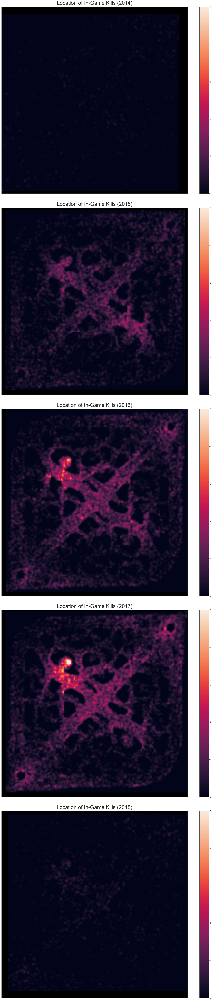

In [14]:
kills_list = [kills_2014, kills_2015, kills_2016, kills_2017, kills_2018]
plot_titles = ['Location of In-Game Kills (2014)',
               'Location of In-Game Kills (2015)', 
               'Location of In-Game Kills (2016)', 
               'Location of In-Game Kills (2017)', 
               'Location of In-Game Kills (2018)']

fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(30,120))

for kills_array, ax, title in zip(kills_list, ax, plot_titles): 
    heatmap, xedges, yedges = np.histogram2d(x=kills_array['x_pos'], y=kills_array['y_pos'], bins=(200,200))
    heatmap = gaussian_filter(heatmap, sigma=0.85)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

    im = ax.imshow(heatmap.T, extent=extent, origin='lower', vmin=0, vmax=5)
    ax.set_xlim(left=0, right=max_x)
    ax.set_ylim(bottom=0, top=max_y)
    ax.set_title(title, size=45, pad=20) 
    ax.set_facecolor('black')
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(im, ax=ax)
    
fig.tight_layout(pad=5.0)

The reason behind the 2014 and 2018 plots being primarily dark is because there is less data for those years. For the years with a considerable amount of data, most of the kills occurred towards the middle of the map. This is likely because this is the most open area of the map, where it is easiest to play mechanically well. From the heatmap, most of the kills during the game occur at the baron ad dragon pit. This makes sense because these are the locations of two powerful game buffs. In 2017, there was a particularly large amount of kills occuring in the baron pit. Other notable locations are each team's bases. This is likely because this is where teams put up their final resistance.  

## Highest Pick Rate Per Lane by Season/Year

These plots will display the champions who had the highest pick rate. These champions likely had high pick rates because they were considered strong at the time and were more likely to lead to a win. 

In [15]:
import re

# Select relevant columns
pick_rate = league[['Year',
                    'Season', 
                    'blueTopChamp', 
                    'blueJungleChamp',
                    'blueMiddleChamp', 
                    'blueADCChamp', 
                    'blueSupportChamp', 
                    'redTopChamp', 
                    'redJungleChamp',
                    'redMiddleChamp', 
                    'redADCChamp', 
                    'redSupportChamp']]

# rename columns
roles = [['Top', 'Blue'], ['Jungle', 'Blue'], ['Mid', 'Blue'], ['ADC', 'Blue'], ['Support', 'Blue'], 
         ['Top', 'Red'], ['Jungle', "Red"], ['Mid', "Red"], ['ADC', 'Red'], ['Support', 'Red']]

# retrieve value counts and determine top 3 most picked champions in each role
for col, role in zip(pick_rate.columns[2:], roles): 
    print('\033[1m' + f'Three Most Picked {role[0]} Champs for {role[1]} Side' + '\033[0m')
    print(pick_rate.groupby(['Year', 'Season'])[col].apply(lambda x: x.value_counts()
                                                    .head(3))
                                                    .to_string())
    print('')
    print('')

Three Most Picked Top Champs for Blue Side
Year  Season           
2014  Summer  Maokai        21
              Ryze          18
              Rumble        13
2015  Spring  Maokai       123
              Gnar         104
              Rumble        73
      Summer  Maokai       172
              Rumble       123
              Gnar          94
2016  Spring  Poppy        200
              Nautilus     119
              Fiora        106
      Summer  Trundle      213
              Gnar         169
              Shen         166
2017  Spring  Nautilus     238
              Maokai       234
              Shen         195
      Summer  JarvanIV     220
              Renekton     204
              Shen         183
2018  Spring  Gnar          51
              Ornn          34
              Gangplank     34


Three Most Picked Jungle Champs for Blue Side
Year  Season          
2014  Summer  LeeSin       28
              Khazix       17
              JarvanIV     11
2015  Spring  JarvanIV    14

From the generated tables, there are champions who are clearly preferred in specific roles for each side. For example: 

- Gnar in Top (Blue), which was a top pick for 4 seasons
- Gragas in Jungle (Blue), which was a top pick for 4 seasons
- Orianna in Mid (Red), which was a top pick for 5 seasons
- Braum in Support (Red), which was a top pick for 4 seasons

This is a clear indicator that there are certain champs who were highly contested and performed well. These champs have considerable game impact, especially in an organized team settings, either through map impact, or AOE abilities. One of the roles that varied a lot is ADC. There is no champ that consistently appeared across the season.   

## Bans per Season Per Year 

By viewing the most common bans during each season, it is possible to determine which champions the players did not want to play against. This is indicative of the strength of each champion. If the champion was frequently banned in other games, but a team was able to play the champion, then that team may have a higher chance of winning. 

In [16]:
# Create function to dummy encode select columns
def bans_to_encodable_cols(df, cols, col_names): 
    for col, names in zip(cols, col_names): 
        df[col] = df[col].apply(ast.literal_eval)
        encodable_cols = pd.DataFrame(df[col].values.tolist(), index=df.index, columns=names) 
        df = pd.concat([df.drop(col, axis=1), encodable_cols], axis = 1) 
        
    return df

In [17]:
# columns to be dummy encoded
ban_cols   = ['blueBans', 'redBans']

# name of new columns
ban_col_names   = [['blueban1', 'blueban2', 'blueban3', 'blueban4', 'blueban5'], 
                   ['redban1', 'redban2', 'redban3', 'redban4', 'redban5']]

# dummy encode bans column
bans_df = bans_to_encodable_cols(league, ban_cols, ban_col_names)

In [18]:
# Select columns of interest
bans_df = bans_df[['Year', 'Season',
                   'blueban1', 'blueban2', 'blueban3', 'blueban4', 'blueban5',
                   'redban1', 'redban2', 'redban3', 'redban4', 'redban5']]

bans_df.head()

,Year,Season,blueban1,blueban2,blueban3,blueban4,blueban5,redban1,redban2,redban3,redban4,redban5
0,2015,Spring,Rumble,Kassadin,Lissandra,None,None,Tristana,Leblanc,Nidalee,None,None
1,2015,Spring,Kassadin,Sivir,Lissandra,None,None,RekSai,Janna,Leblanc,None,None
2,2015,Spring,JarvanIV,Lissandra,Kassadin,None,None,Leblanc,Zed,RekSai,None,None
3,2015,Spring,Annie,Lissandra,Kassadin,None,None,RekSai,Rumble,LeeSin,None,None
4,2015,Spring,Irelia,Pantheon,Kassadin,None,None,Rumble,Sivir,Rengar,None,None


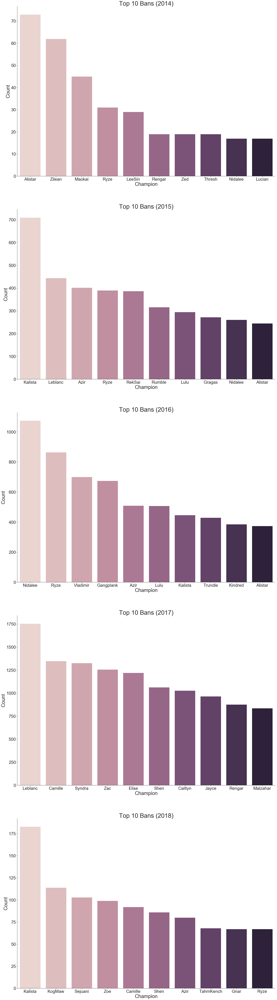

In [19]:
# Melt dataframe into format suitable for barplots
bans_df_long = pd.melt(bans_df,
                       id_vars=['Year', 'Season'], 
                       value_vars=['blueban1', 'blueban2', 'blueban3', 'blueban4', 'blueban5',
                                   'redban1', 'redban2', 'redban3', 'redban4', 'redban5'], 
                       var_name='ban',
                       value_name='champion')

# Filter dataframe by year
bans_2014 = bans_df_long[bans_df_long['Year'] == 2014]
bans_2015 = bans_df_long[bans_df_long['Year'] == 2015]
bans_2016 = bans_df_long[bans_df_long['Year'] == 2016]
bans_2017 = bans_df_long[bans_df_long['Year'] == 2017]
bans_2018 = bans_df_long[bans_df_long['Year'] == 2018]

# Initialize plot data/aesthetics
bans_list = [bans_2014, bans_2015, bans_2016, bans_2017, bans_2018]
years = ['2014', '2015', '2016', '2017', '2018']
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(30,100))

# Create bar plots for each year of the top 10 most banned champions
for bans, ax, year in zip(bans_list, ax, years):
    sns.countplot(x='champion', data=bans, ax=ax, palette=sns.cubehelix_palette(10, reverse=False),
                  order=bans.champion.value_counts().iloc[:10].index)
    ax.set_xlabel("Champion", size=35)
    ax.set_ylabel("Count", size=35)
    ax.set_title(f"Top 10 Bans ({year})", size=43)
    ax.tick_params(axis="both", which='major', labelsize=30)
    sns.despine()
    
fig.tight_layout(pad=10.0)

In each year, there is a champion that is clearly banned more frequently than others. These champions are:

1. Alistar
2. Kalista
3. Nidalee
4. Leblanc
5. Kalista

## Champion correlation plot

By plotting a correlation plot between champions in each role, it is possible to determine which champions are typically plyed in response to another champion. This will help gain an understanding of common matchups and the impact it has on the game. 

In [20]:
def dummy_encode(df):
    for col in df.columns:
        df = pd.concat([df.drop(col, axis=1), pd.get_dummies(df[col])], axis=1)
    
    return df

In [21]:
def plot_heatmap(df, cols, role, threshold, ax, plot_title): 
    heatmap_df = df[cols]
    heatmap_df = dummy_encode(heatmap_df)
    heatmap_df = heatmap_df.groupby(lambda x:x, axis=1).sum()
    print('\033[1m' + role + '\033[0m')
    print(f"Initial Number of columns: {len(heatmap_df.columns)}")

    sum_df = heatmap_df.sum()
    sum_df = sum_df > threshold
    
    heatmap_df = heatmap_df.iloc[:, sum_df.values]
    print(f"Number of columns following reduction: {len(heatmap_df.columns)}")
    print("")
    corr = heatmap_df.corr()
    
    top_corr = sns.heatmap(corr, 
                           xticklabels=corr.columns,
                           yticklabels=corr.columns, 
                           vmin=-1, vmax=1, center=0,
                           cmap = "coolwarm",
                           ax = ax)
    
    ax.set_title(plot_title, size = 40, pad = 10.0)

Top
Initial Number of columns: 88
Number of columns following reduction: 26

Jungle
Initial Number of columns: 70
Number of columns following reduction: 16

Mid
Initial Number of columns: 86
Number of columns following reduction: 23

ADC
Initial Number of columns: 39
Number of columns following reduction: 16

Support
Initial Number of columns: 63
Number of columns following reduction: 19



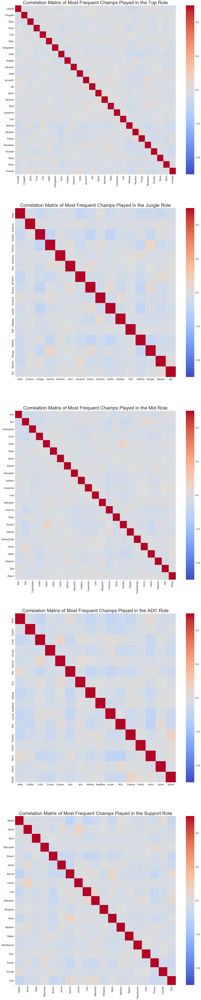

In [22]:
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(30,150))

plot_heatmap(league, 
             ['blueTopChamp', 'redTopChamp'], 
             "Top", 
             threshold = 150,
             ax = ax[0], 
             plot_title = "Correlation Matrix of Most Frequent Champs Played in the Top Role")

plot_heatmap(league, 
             ['blueJungleChamp', 'redJungleChamp'],
             "Jungle",
             threshold = 150,
             ax = ax[1], 
             plot_title = "Correlation Matrix of Most Frequent Champs Played in the Jungle Role")

plot_heatmap(league, 
             ['blueMiddleChamp', 'redMiddleChamp'], 
             "Mid", 
             threshold = 150,
             ax = ax[2], 
             plot_title = "Correlation Matrix of Most Frequent Champs Played in the Mid Role")

plot_heatmap(league, 
             ['blueADCChamp', 'redADCChamp'], 
             "ADC",
             threshold = 150,
             ax = ax[3], 
             plot_title = "Correlation Matrix of Most Frequent Champs Played in the ADC Role")

plot_heatmap(league, 
             ['blueSupportChamp', 'redSupportChamp'], 
             "Support",
             threshold = 150,
             ax = ax[4], 
             plot_title = "Correlation Matrix of Most Frequent Champs Played in the Support Role")

Because of the large amount of champions available to play within the game, there are very few noticeable correlations. The noticeable correlations are as follows:

- Top
    - None
- Jungle 
    - Graves and Rengar
    - Lee sin and Khazix
- Mid 
    - Syndra and Ekko
- ADC 
    - Graves and Corki
    - Tristana and Xayah
- Support 
    - Leona and Annie 
    - Nami and Karma 
    
These matchups are largely determined by champion abilities and what is considered meta at the time. FOr example, Ekko is a champion that is considered a counter to Syndra due to his high mobility and ability to negate Syndra's damage. Additionally, it is extremely likely that these champions are ones that recieved buffs right before tournaments, so they were considered strong at the time. 